**Libraries**

In [1]:
import os
import kagglehub
import matplotlib.pyplot as plt
from matplotlib.image import imread
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

**Functions**

In [93]:
import os
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread

def display_images_by_category(dataset_path, num_images=5):
    """
    Displays a few random images from each category in a directory structure.
    """
    try:
        categories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
        if not categories:
            print("No categories found in the dataset path.")
            return

        for category in categories:
            category_path = os.path.join(dataset_path, category)
            image_files = [os.path.join(category_path, file) for file in os.listdir(category_path)
                           if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

            if not image_files:
                print(f"No images found in category: {category}")
                continue

            # Select random images for display
            selected_images = random.sample(image_files, min(num_images, len(image_files)))

            # Plot the images in a single row
            fig, axes = plt.subplots(1, len(selected_images), figsize=(15, 5))
            fig.suptitle(f"Category: {category}", fontsize=16)

            for ax, img_path in zip(axes, selected_images):
                img = imread(img_path)
                ax.imshow(img)
                ax.set_title(os.path.basename(img_path), fontsize=10)
                ax.axis('off')

            plt.tight_layout()
            plt.show()

    except Exception as e:
        print(f"Error: {e}")


In [3]:
def display_images(dataset_path, num_images=9):
    """
    Display a grid of images with their labels from a given dataset.
    """
    # Take 1 batch of data from the dataset
    for images, labels in dataset_path.take(1):
        images = images.numpy()
        labels = labels.numpy()

        # Integers in the range [0, 255]
        images = images.clip(0, 255)
        images = images.astype("uint8")
        break

    # Plotting setup
    grid_size = int(num_samples**0.5)
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Plot the images with labels
    for i in range(min(num_samples, len(images))):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(images[i])
        plt.title(f"Label: {labels[i]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

## Import Data




In [4]:
dataset_path = kagglehub.dataset_download("ashishmotwani/tomato")
print("Path to dataset files:", dataset_path)

100%|██████████| 1.37G/1.37G [00:21<00:00, 67.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1


In [85]:
import os
os.listdir(dataset_path + '/valid')

['Early_blight',
 'Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato_mosaic_virus',
 'powdery_mildew',
 'healthy',
 'Late_blight',
 'Spider_mites Two-spotted_spider_mite',
 'Leaf_Mold',
 'Target_Spot',
 'Septoria_leaf_spot',
 'Bacterial_spot']

In [90]:
train_path = dataset_path + '/train'
valid_path = dataset_path + '/valid'

## View sample images

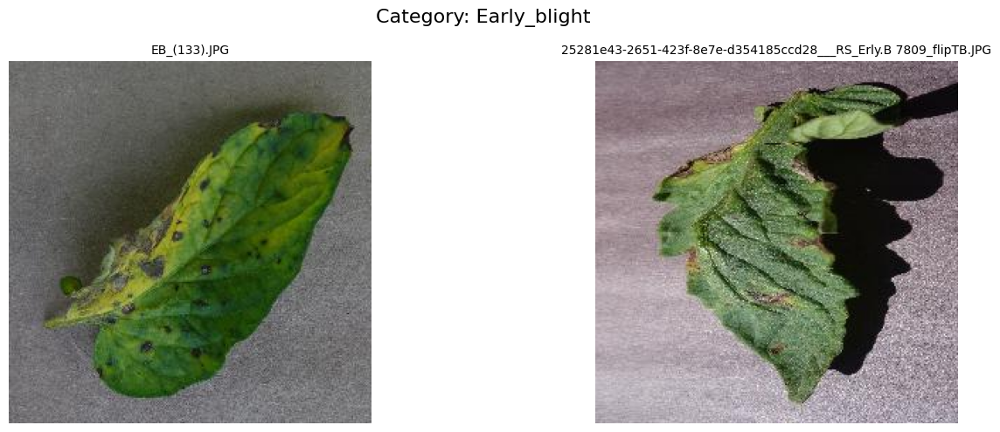

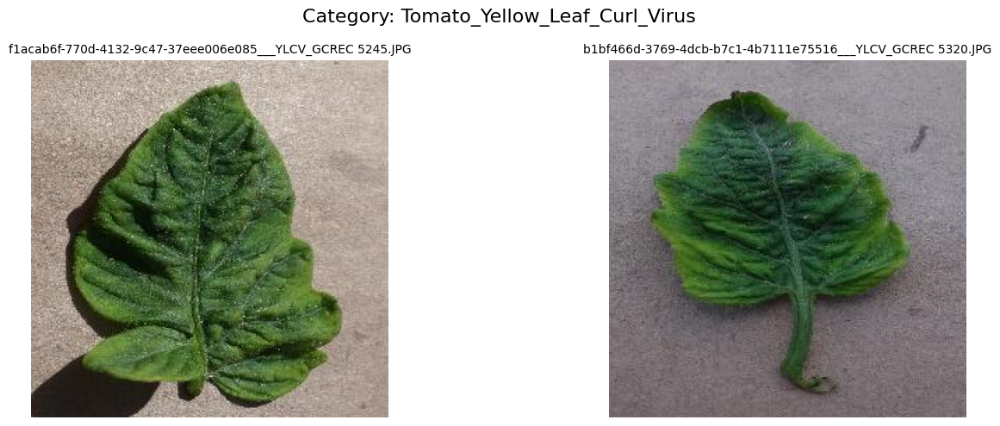

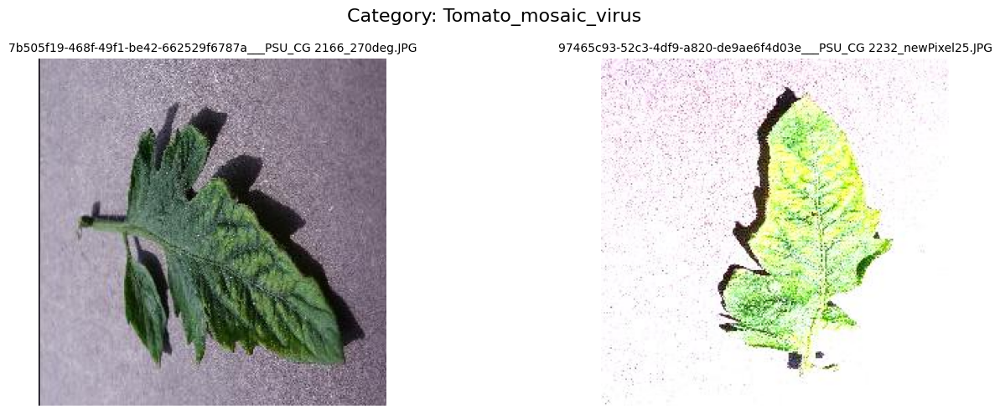

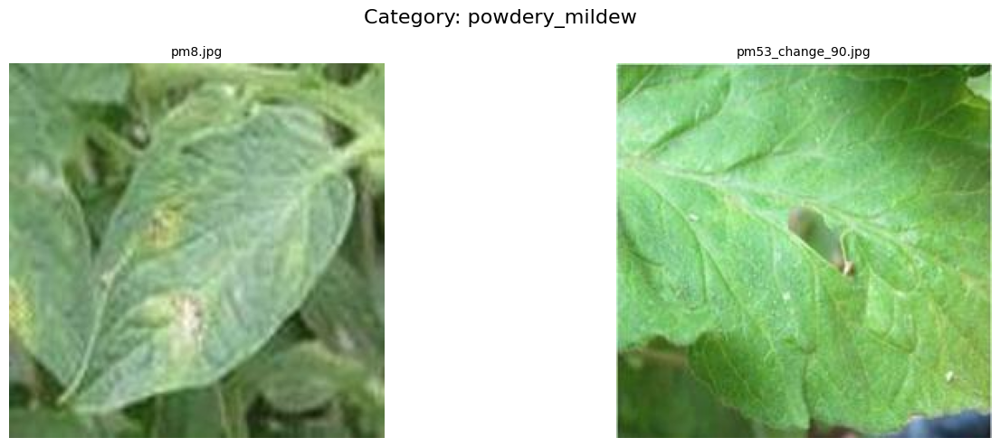

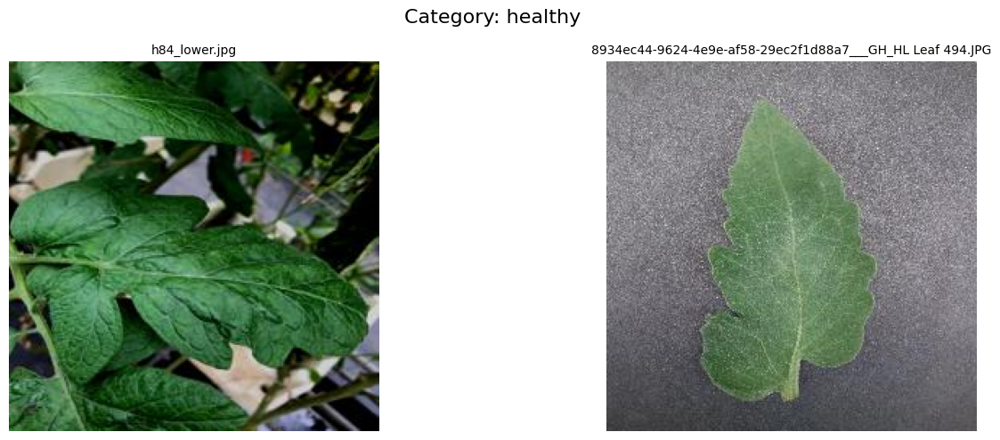

...

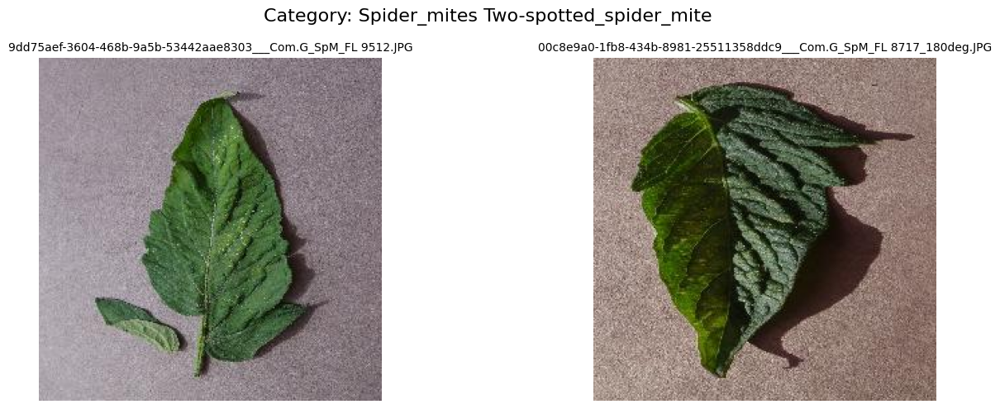

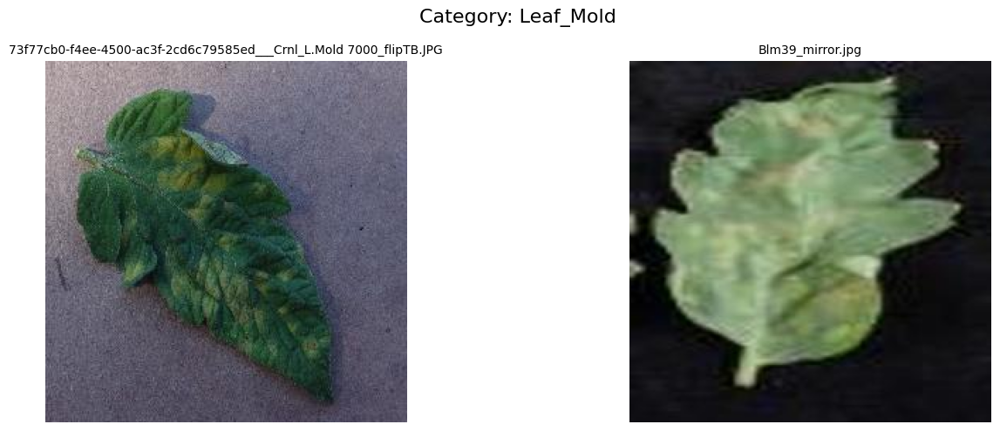

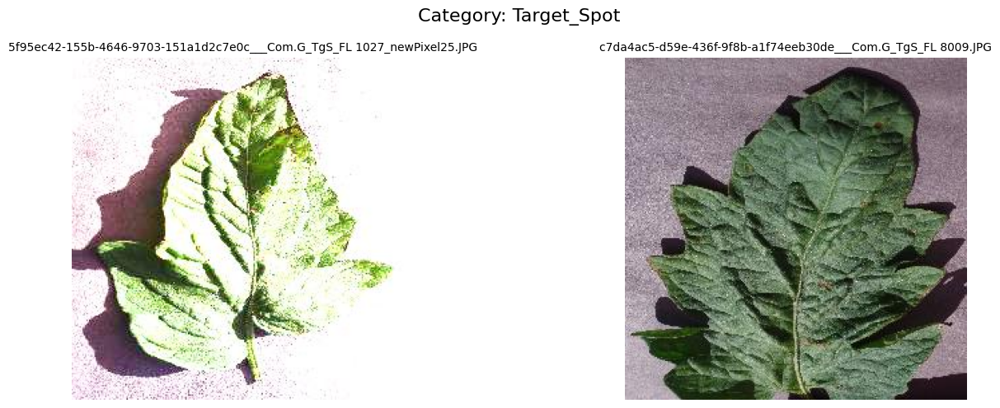

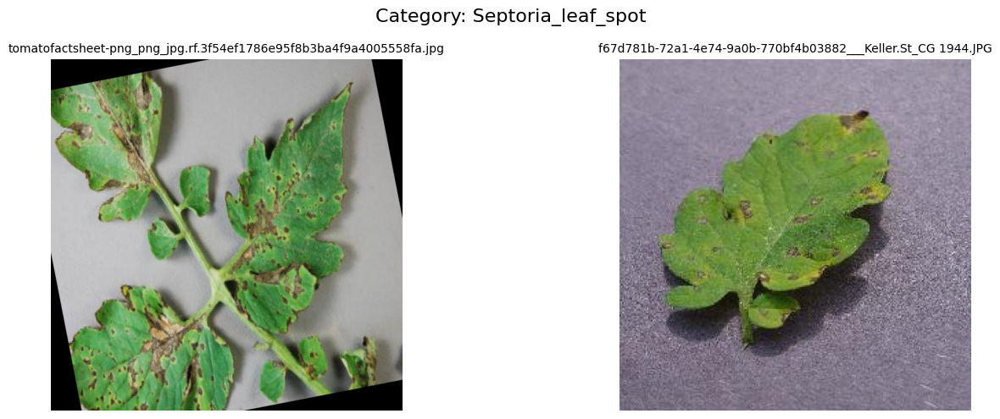

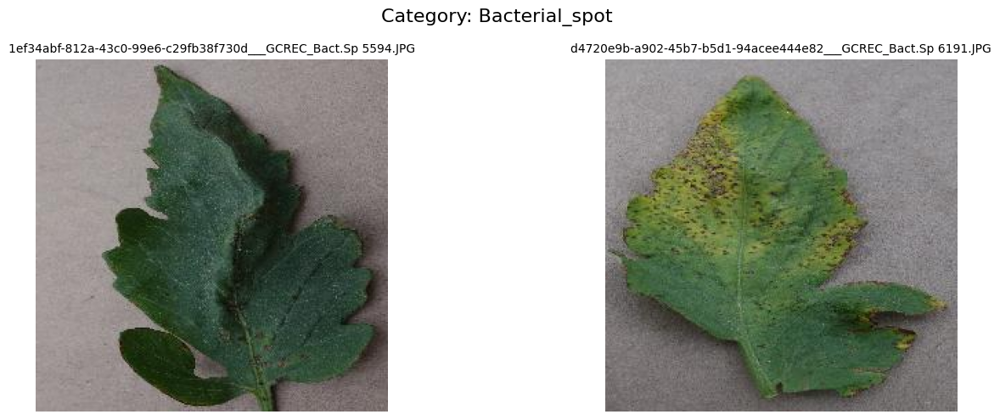

In [94]:
display_images_by_category(train_path, num_images=2)

In [ ]:
# display_images_by_category(dataset_path, num_images=5)

In [96]:
# View all categories in train and validation data:
for path in [train_path, valid_path]:
    print("\n",path)
    for category in os.listdir(path):
        category_path = os.path.join(path, category)
        if os.path.isdir(category_path):
            print(f"Category: {category}")
            print("Number of samples:", len(os.listdir(category_path)))
            files = os.listdir(category_path)
            # print(f"Files: {files}")


 /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/train
Category: Early_blight
Number of samples: 2455
Category: Tomato_Yellow_Leaf_Curl_Virus
Number of samples: 2039
Category: Tomato_mosaic_virus
Number of samples: 2153
Category: powdery_mildew
Number of samples: 1004
Category: healthy
Number of samples: 3051
Category: Late_blight
Number of samples: 3113
Category: Spider_mites Two-spotted_spider_mite
Number of samples: 1747
Category: Leaf_Mold
Number of samples: 2754
Category: Target_Spot
Number of samples: 1827
Category: Septoria_leaf_spot
Number of samples: 2882
Category: Bacterial_spot
Number of samples: 2826

 /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid
Category: Early_blight
Number of samples: 643
Category: Tomato_Yellow_Leaf_Curl_Virus
Number of samples: 498
Category: Tomato_mosaic_virus
Number of samples: 584
Category: powdery_mildew
Number of samples: 252
Category: healthy
Number of samples: 805
Category: Late_blight
Number of samples:

### Split training and validation data and resizing the data

In [99]:
# Load the entire dataset and reserve 20% for testing
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_path,
    image_size=(224, 224),
    batch_size=32
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    valid_path,
    image_size=(224, 224),
    batch_size=32
)

Found 25851 files belonging to 11 classes.
Found 6683 files belonging to 11 classes.


In [100]:
for x, y in train_dataset.take(1):
    # print("x:", x)
    print("y:", y)

y: tf.Tensor([8 3 1 6 4 6 9 2 8 2 9 2 2 8 2 1 3 7 9 8 8 9 0 0 3 5 9 9 0 5 2 1], shape=(32,), dtype=int32)


In [103]:
len(train_dataset), len(train_dataset)*32

(808, 25856)

In [104]:
len(validation_dataset), len(validation_dataset)*32

(209, 6688)

In [105]:
def display_samples(dataset, title, num_samples=9):
    """
    Display a grid of images with their labels from a given dataset.
    """
    # Take 1 batch of data from the dataset
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = labels.numpy()

        # Integers in the range [0, 255]
        images = images.clip(0, 255)
        images = images.astype("uint8")
        break

    # Plotting setup
    grid_size = int(num_samples**0.5)
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Plot the images with labels
    for i in range(min(num_samples, len(images))):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(images[i])
        plt.title(f"Label: {labels[i]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

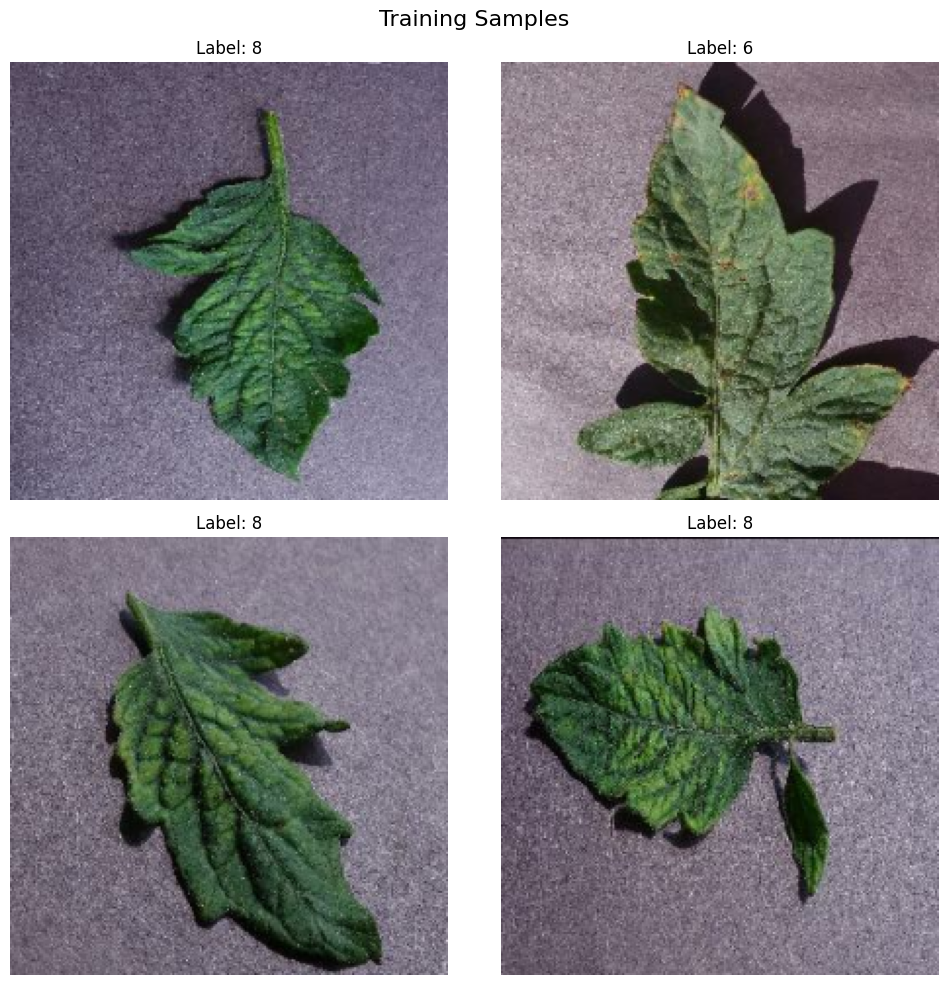

In [106]:
display_samples(train_dataset, "Training Samples", 4)

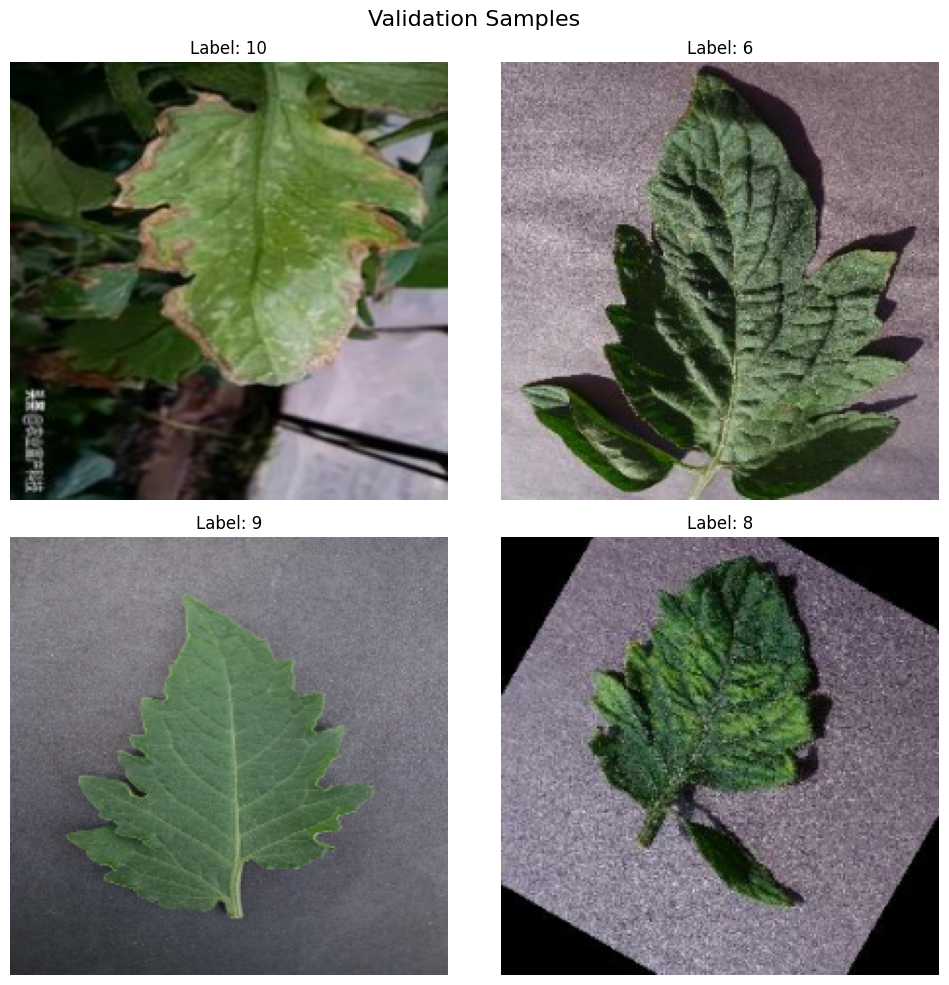

In [107]:
display_samples(validation_dataset, "Validation Samples", 4)

## Data Augmentation

Dat augmentation is used to prevent overffing by adding variability to the training data. This medthod improve generalization by helping the model learn features that are in various different orientations, scale and position. The following transformations are applied to enhance dataset diversity:

- Geometric Transformations: Flip, rotate, crop, or resize.

- Color Adjustments: Change brightness, contrast, saturation, or apply grayscale.

- Noise Injection: Add random noise for robustness.

- Distortions: Apply random zoom, shear, or perspective transformations.

In [108]:
import tensorflow as tf
from tensorflow.keras.layers import (
    RandomFlip, RandomRotation, RandomZoom, RandomCrop, RandomTranslation,
    Rescaling, RandomContrast, RandomBrightness
)

data_augmentation = tf.keras.Sequential([
    # Geometric Transformations
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomCrop(height=200, width=200),
    RandomTranslation(height_factor=0.1, width_factor=0.1),

    # Color Adjustments
    RandomBrightness(factor=0.2),
    RandomContrast(factor=0.2),

    # Normalization so that the pixel values in most images are represented as
    # integers between 0 and 255, and scaling them to [0, 1] helps a CNN model
    # train more effectively by standardizing the input range.
    Rescaling(1.0 / 255),

    # Distortions
    RandomZoom(height_factor=0.0, width_factor=(-0.3, 0.3))
])

In [109]:
# Apply data augmentation to the training dataset
train_dataset_augmented = train_dataset.map(lambda x, y: (data_augmentation(x, training=True), y))

shape (32, 200, 200, 3)


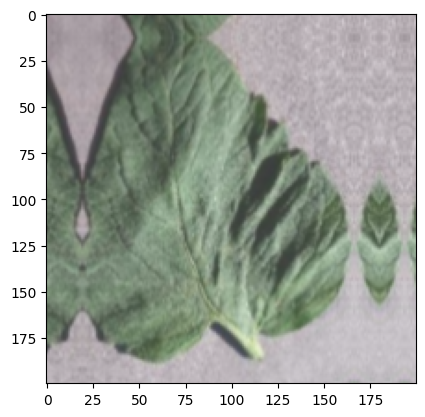

In [110]:
for batch in train_dataset_augmented.take(1):
    print("shape", batch[0].numpy().shape)
    plt.imshow(batch[0].numpy()[0])
    plt.show()


## Label Encoding

Categorical Labels: Convert class names into integers or one-hot encoding for classification tasks.

In [111]:
# List of categories
labels = [
    'powdery_mildew', 'Septoria_leaf_spot', 'Target_Spot', 'Leaf_Mold',
    'Tomato_mosaic_virus', 'Late_blight', 'Spider_mites Two-spotted_spider_mite',
    'Early_blight', 'Tomato_Yellow_Leaf_Curl_Virus', 'healthy', 'Bacterial_spot'
]

# Create a dictionary for label encoding
label_mapping = {name: idx for idx, name in enumerate(labels)}

print("Label Mapping:")
print(label_mapping)

Label Mapping:
{'powdery_mildew': 0, 'Septoria_leaf_spot': 1, 'Target_Spot': 2, 'Leaf_Mold': 3, 'Tomato_mosaic_virus': 4, 'Late_blight': 5, 'Spider_mites Two-spotted_spider_mite': 6, 'Early_blight': 7, 'Tomato_Yellow_Leaf_Curl_Virus': 8, 'healthy': 9, 'Bacterial_spot': 10}


In [112]:
# Encode labels
encoded_labels = [label_mapping[label] for label in labels]

print("Encoded Labels:")
print(encoded_labels)

Encoded Labels:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [113]:
# Map encoded labels to TensorFlow dataset
train_dataset_with_labels = train_dataset_augmented.map(lambda x, y: (x, tf.one_hot(y, depth=len(labels))))

# Verify the labels
for images, labels in train_dataset_with_labels.take(1):
    print("One-hot Encoded Labels:")
    print(labels.numpy())

One-hot Encoded Labels:
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0.